<a href="https://colab.research.google.com/github/inuwamobarak/Image-captioning-ViT/blob/main/Image_Captioning_using_Transformer_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started

**Problem Statement: Develop a multilingual assistive model that helps visually impaired users by describing images in multiple Indian languages and narrating the descriptions via audio. Workflow: Use Vision Transformer (ViT)(/Any other model) to perform image classification or object detection, identifying objects in the scene. Apply IndicTrans2(/Any other model) to translate the generated text descriptions into multiple Indian languages. Use Whisper Model(/Any other model) to convert the text into speech and narrate the descriptions. Dataset: You can use publicly available datasets such as MS-COCO for image-captioning tasks, which provide both images and descriptions. For Indian language translations, the FLORES dataset or IndicNLP resources can be helpful. You are free to use any other datasets as well.**







**Image** captioning involves translating an image into a textual description. We use Vision Transformers (ViT) and PyTorch backend. The article and code demonstrates using trained models without retraining from scratch to generate image captions.

# Using a Trained Model

In [33]:
from transformers import VisionEncoderDecoderModel, GPT2TokenizerFast, ViTImageProcessor
import torch

# Specify the device (GPU or CPU)
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the ViT Encoder-Decoder Model
model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning").to(device)

# Load the corresponding GPT2 Tokenizer
tokenizer = GPT2TokenizerFast.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

# Load the ViT Image Processor
image_processor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Preparing image for capturing

In [34]:
import urllib.parse as parse
import os
# Verify url
def check_url(string):
    try:
        result = parse.urlparse(string)
        return all([result.scheme, result.netloc, result.path])
    except:
        return False

# Load an image
def load_image(image_path):
    if check_url(image_path):
        return Image.open(requests.get(image_path, stream=True).raw)
    elif os.path.exists(image_path):
        return Image.open(image_path)

In [35]:
# Image inference
def get_caption(model, image_processor, tokenizer, image_path):
    image = load_image(image_path)

    # Preprocessing the Image
    img = image_processor(image, return_tensors="pt").to(device)

    # Generating captions
    output = model.generate(**img)

    # decode the output
    caption = tokenizer.batch_decode(output, skip_special_tokens=True)[0]

    return caption

# Loading and Capturing Images

In [36]:
#  Image media display
from IPython.display import display
from PIL import Image
import requests
import os

*Example 1.*

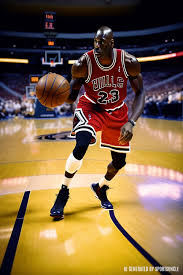

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.


'a man is playing basketball on a court '

In [37]:
# Loading URLs
url = "/content/BA.jpeg"

# Display Image
display(load_image(url))

# Display Caption
get_caption(model, image_processor, tokenizer, url)

*Example 2.*

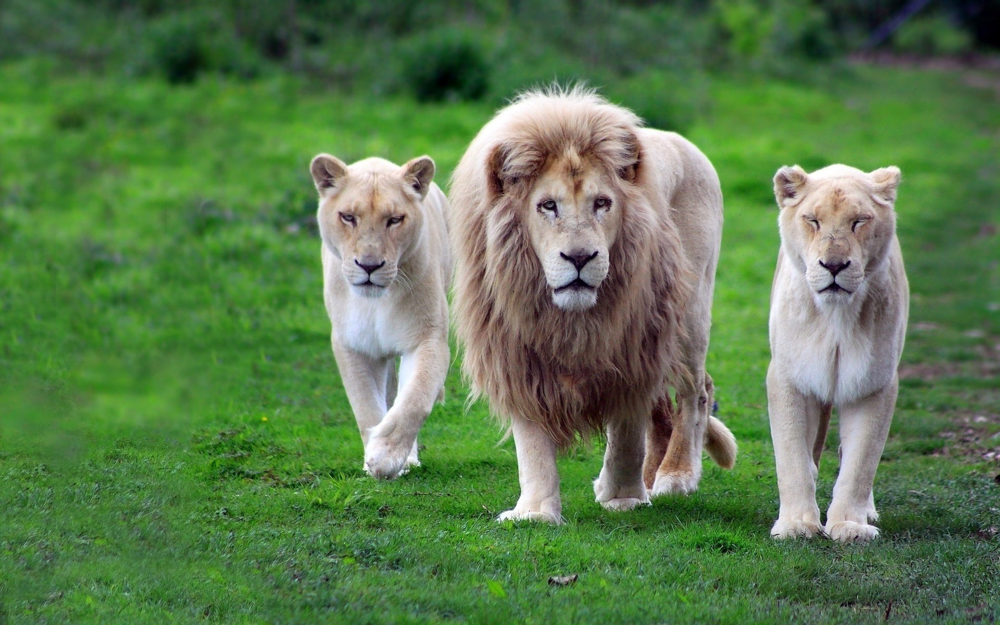

'two small animals standing on top of a lush green field '

In [38]:
# Loading URLs
url = "/content/loin.jpeg"

# Display Image
display(load_image(url))

# Display Caption
get_caption(model, image_processor, tokenizer, url)

*Example 3.*

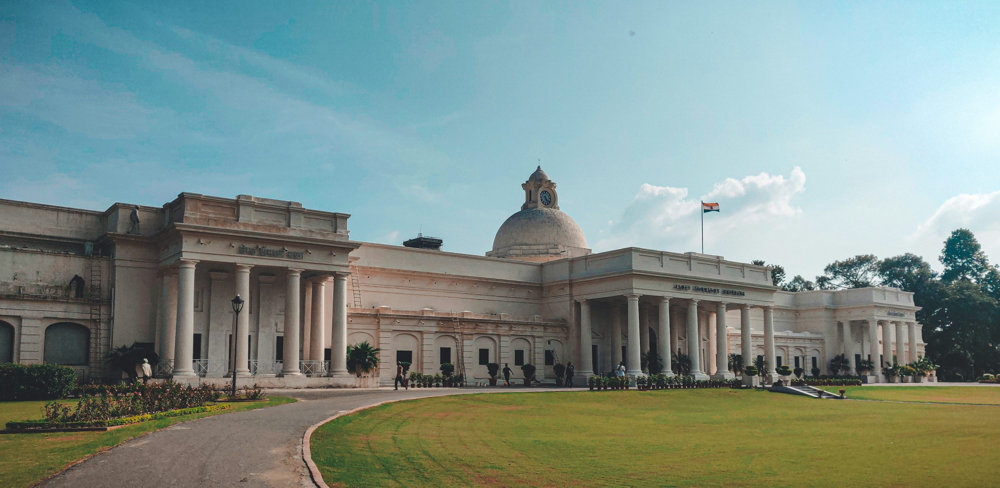

In [39]:
# Loading URLs
url = "/content/pic.jpeg"

# Display Image
display(load_image(url))

# Display Caption
a=get_caption(model, image_processor, tokenizer, url)

In [40]:
a

'a large building with a large clock on it '

# IndicTrans2 HF Inference

We provide an example notebook on how to use our IndicTrans2 models which were originally trained with the fairseq to HuggingFace transformers for inference purpose.


## Setup

Please run the cells below to install the necessary dependencies.


In [10]:
%%capture
!git clone https://github.com/AI4Bharat/IndicTrans2.git

In [11]:
%%capture
%cd /content/IndicTrans2/huggingface_interface

In [2]:
%%capture
!python3 -m pip install nltk sacremoses pandas regex mock transformers>=4.33.2 mosestokenizer
!python3 -c "import nltk; nltk.download('punkt')"
!python3 -m pip install bitsandbytes scipy accelerate datasets
!python3 -m pip install sentencepiece

!git clone https://github.com/VarunGumma/IndicTransToolkit.git
%cd IndicTransToolkit
!python3 -m pip install --editable ./
%cd ..

**IMPORTANT : Restart your run-time first and then run the cells below.**

## Inference


In [1]:
import torch
from transformers import AutoModelForSeq2SeqLM, BitsAndBytesConfig, AutoTokenizer
from IndicTransToolkit import IndicProcessor

BATCH_SIZE = 4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
quantization = None

In [2]:
def initialize_model_and_tokenizer(ckpt_dir, quantization):
    if quantization == "4-bit":
        qconfig = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_use_double_quant=True,
            bnb_4bit_compute_dtype=torch.bfloat16,
        )
    elif quantization == "8-bit":
        qconfig = BitsAndBytesConfig(
            load_in_8bit=True,
            bnb_8bit_use_double_quant=True,
            bnb_8bit_compute_dtype=torch.bfloat16,
        )
    else:
        qconfig = None

    tokenizer = AutoTokenizer.from_pretrained(ckpt_dir, trust_remote_code=True)
    model = AutoModelForSeq2SeqLM.from_pretrained(
        ckpt_dir,
        trust_remote_code=True,
        low_cpu_mem_usage=True,
        quantization_config=qconfig,
    )

    if qconfig == None:
        model = model.to(DEVICE)
        if DEVICE == "cuda":
            model.half()

    model.eval()

    return tokenizer, model


def batch_translate(input_sentences, src_lang, tgt_lang, model, tokenizer, ip):
    translations = []
    for i in range(0, len(input_sentences), BATCH_SIZE):
        batch = input_sentences[i : i + BATCH_SIZE]

        # Preprocess the batch and extract entity mappings
        batch = ip.preprocess_batch(batch, src_lang=src_lang, tgt_lang=tgt_lang)

        # Tokenize the batch and generate input encodings
        inputs = tokenizer(
            batch,
            truncation=True,
            padding="longest",
            return_tensors="pt",
            return_attention_mask=True,
        ).to(DEVICE)

        # Generate translations using the model
        with torch.no_grad():
            generated_tokens = model.generate(
                **inputs,
                use_cache=True,
                min_length=0,
                max_length=256,
                num_beams=5,
                num_return_sequences=1,
            )

        # Decode the generated tokens into text

        with tokenizer.as_target_tokenizer():
            generated_tokens = tokenizer.batch_decode(
                generated_tokens.detach().cpu().tolist(),
                skip_special_tokens=True,
                clean_up_tokenization_spaces=True,
            )

        # Postprocess the translations, including entity replacement
        translations += ip.postprocess_batch(generated_tokens, lang=tgt_lang)

        del inputs
        torch.cuda.empty_cache()

    return translations

In [19]:
l=[]
a = 1
l.append(a)
l

[1]

### English to Indic Example


In [20]:
en_sents = ["1"] # Changed integer 1 to a string "1"

In [23]:
def batch_translate(input_sentences, src_lang, tgt_lang, model, tokenizer, ip): # Added ip as an argument
    translations = []
    for i in range(0, len(input_sentences), BATCH_SIZE):
        batch = input_sentences[i : i + BATCH_SIZE]

        # Preprocess the batch and extract entity mappings
        batch = ip.preprocess_batch(batch, src_lang=src_lang, tgt_lang=tgt_lang)

        # Tokenize the batch and generate input encodings
        inputs = tokenizer(
            batch,
            truncation=True,
            padding="longest",
            return_tensors="pt",
            return_attention_mask=True,
        ).to(DEVICE)

        # Generate translations using the model
        with torch.no_grad():
            generated_tokens = model.generate(
                **inputs,
                use_cache=True,
                min_length=0,
                max_length=256,
                num_beams=5,
                num_return_sequences=1,
            )

        # Decode the generated tokens into text

        with tokenizer.as_target_tokenizer():
            generated_tokens = tokenizer.batch_decode(
                generated_tokens.detach().cpu().tolist(),
                skip_special_tokens=True,
                clean_up_tokenization_spaces=True,
            )

        # Postprocess the translations, including entity replacement
        translations += ip.postprocess_batch(generated_tokens, lang=tgt_lang)

        del inputs
        torch.cuda.empty_cache()

    return translations

In [41]:
en_indic_ckpt_dir = "ai4bharat/indictrans2-en-indic-1B"  # ai4bharat/indictrans2-en-indic-dist-200M
en_indic_tokenizer, en_indic_model = initialize_model_and_tokenizer(en_indic_ckpt_dir, quantization)

ip = IndicProcessor(inference=True)

en_sents = ["a large building with a large clock on it"] # Changed integer 1 to a string "1"

src_lang, tgt_lang = "eng_Latn", "hin_Deva"
hi_translations = batch_translate(en_sents, src_lang, tgt_lang, en_indic_model, en_indic_tokenizer, ip)

print(f"\n{src_lang} - {tgt_lang}")
for input_sentence, translation in zip(en_sents, hi_translations):
    print(f"{src_lang}: {input_sentence}")
    print(f"{tgt_lang}: {translation}")

# flush the models to free the GPU memory
del en_indic_tokenizer, en_indic_model


eng_Latn - hin_Deva
eng_Latn: a large building with a large clock on it
hin_Deva: एक बड़ी इमारत जिस पर एक बड़ी घड़ी है 


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:4126: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


In [42]:
hi_translations

['एक बड़ी इमारत जिस पर एक बड़ी घड़ी है ']

In [43]:
!pip install gTTs

In [44]:
from gtts import gTTS
from IPython.display import Audio

# Function to convert text to speech and play in Colab
def text_to_speech_colab(text, lang='hi'):
    tts = gTTS(text=text, lang=lang)
    tts.save('speech.mp3')
    return Audio('speech.mp3', autoplay=True)

# Example: Convert translated caption into speech and play
translated_caption = hi_translations[0]
text_to_speech_colab(translated_caption, lang='hi')
